# <font>About Dataset</font>

## <font>Content</font>
This data set contains details of a bank's customers and the target variable is a binary variable reflecting the fact whether the customer left the bank (closed his account) or he continues to be a customer.

## <font>Variables</font>

* RowNumber: Row Numbers from 1 to 10000
* CustomerId: Unique Ids for bank customer identification
* Surname: Customer's last name
* CreditScore: Credit score of the customer
* Geography: The country from which the customer belongs
* Gender: Male or Female
* Age: Age of the customer
* Tenure: Number of years for which the customer has been with the bank
* Balance: Bank balance of the customer
* NumOfProducts: Number of bank products the customer is utilising
* HasCrCard: Binary Flag for whether the customer holds a credit card with the bank or not
* IsActiveMember: Binary Flag for whether the customer is an active member with the bank or not
* EstimatedSalary: Estimated salary of the customer in Dollars
* Exited: Binary flag 1 if the customer closed account with bank and 0 if the customer is retained

In [1]:
import seaborn as sns
import seaborn.objects as so
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pandas_profiling

C:\Users\u1285310\AppData\Local\Temp\ipykernel_14664\3541552571.py:7: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


## <font color='blue'>Análise do banco de dados</font>

In [2]:
df = pd.read_csv('C:\\Users\\u1285310\\OneDrive - MMC\\Documents\\Anaconda\\Aulas + Entregas/Churn_Modelling.csv')
df.head(10)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
5,6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
6,7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
7,8,15656148,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
8,9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
9,10,15592389,H?,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


In [3]:
# Remover as colunas Rownumber and Customerld
df = df.drop(["RowNumber", 'CustomerId'], axis=1)
df.head(3)

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Surname          10000 non-null  object 
 1   CreditScore      10000 non-null  int64  
 2   Geography        10000 non-null  object 
 3   Gender           10000 non-null  object 
 4   Age              10000 non-null  int64  
 5   Tenure           10000 non-null  int64  
 6   Balance          10000 non-null  float64
 7   NumOfProducts    10000 non-null  int64  
 8   HasCrCard        10000 non-null  int64  
 9   IsActiveMember   10000 non-null  int64  
 10  EstimatedSalary  10000 non-null  float64
 11  Exited           10000 non-null  int64  
dtypes: float64(2), int64(7), object(3)
memory usage: 937.6+ KB


In [5]:
#Transformação das váriáveis binárias para variáveis categóricas
df.HasCrCard = df.HasCrCard.replace({0:'Non_CredCard',1:'CredCard'})
df.IsActiveMember = df.IsActiveMember.replace({0:'Non_ActiveMember',1:'ActiveMember'})
df.Exited = df.Exited.replace({0:'Non_Exited',1:'Exited'})
df.head(10)

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,Hargrave,619,France,Female,42,2,0.00,1,CredCard,ActiveMember,101348.88,Exited
1,Hill,608,Spain,Female,41,1,83807.86,1,Non_CredCard,ActiveMember,112542.58,Non_Exited
2,Onio,502,France,Female,42,8,159660.80,3,CredCard,Non_ActiveMember,113931.57,Exited
3,Boni,699,France,Female,39,1,0.00,2,Non_CredCard,Non_ActiveMember,93826.63,Non_Exited
4,Mitchell,850,Spain,Female,43,2,125510.82,1,CredCard,ActiveMember,79084.10,Non_Exited
5,Chu,645,Spain,Male,44,8,113755.78,2,CredCard,Non_ActiveMember,149756.71,Exited
6,Bartlett,822,France,Male,50,7,0.00,2,CredCard,ActiveMember,10062.80,Non_Exited
7,Obinna,376,Germany,Female,29,4,115046.74,4,CredCard,Non_ActiveMember,119346.88,Exited
8,He,501,France,Male,44,4,142051.07,2,Non_CredCard,ActiveMember,74940.50,Non_Exited
9,H?,684,France,Male,27,2,134603.88,1,CredCard,ActiveMember,71725.73,Non_Exited


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Surname          10000 non-null  object 
 1   CreditScore      10000 non-null  int64  
 2   Geography        10000 non-null  object 
 3   Gender           10000 non-null  object 
 4   Age              10000 non-null  int64  
 5   Tenure           10000 non-null  int64  
 6   Balance          10000 non-null  float64
 7   NumOfProducts    10000 non-null  int64  
 8   HasCrCard        10000 non-null  object 
 9   IsActiveMember   10000 non-null  object 
 10  EstimatedSalary  10000 non-null  float64
 11  Exited           10000 non-null  object 
dtypes: float64(2), int64(4), object(6)
memory usage: 937.6+ KB


In [7]:
df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
CreditScore,10000.0,650.53,96.65,350.00,584.00,652.00,718.00,850.00
Age,10000.0,38.92,10.49,18.00,32.00,37.00,44.00,92.00
Tenure,10000.0,5.01,2.89,0.00,3.00,5.00,7.00,10.00
Balance,10000.0,76485.89,62397.41,0.00,0.00,97198.54,127644.24,250898.09
NumOfProducts,10000.0,1.53,0.58,1.00,1.00,1.00,2.00,4.00
EstimatedSalary,10000.0,100090.24,57510.49,11.58,51002.11,100193.92,149388.25,199992.48


## <font color='blue'>Análise Univariada</font>

<AxesSubplot: xlabel='Gender', ylabel='count'>

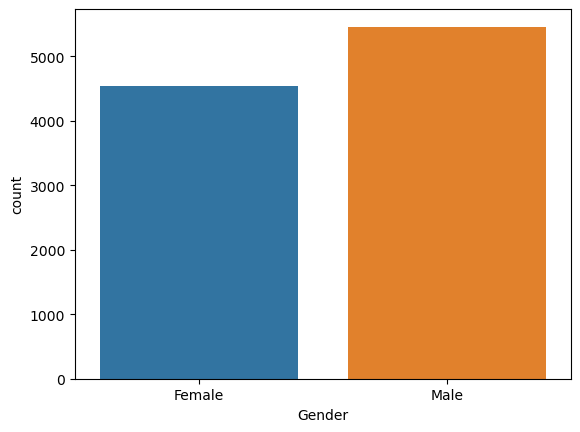

In [8]:
#Qual a quantidade de homens e mulheres?
# Análise: quantidade de usuários majoritariamento masculina.
sns.countplot(x=df["Gender"])

<AxesSubplot: xlabel='NumOfProducts', ylabel='count'>

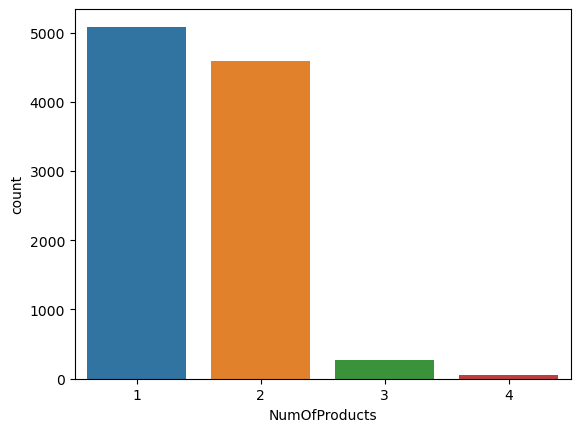

In [9]:
#Qual a quantidade de cada produto utilizado pelos clientes?
# Análise: quantidade de clinete com 1 ou 2 produtos maior do que com 3 ou 4.
sns.countplot(x=df["NumOfProducts"])

<AxesSubplot: xlabel='Tenure', ylabel='count'>

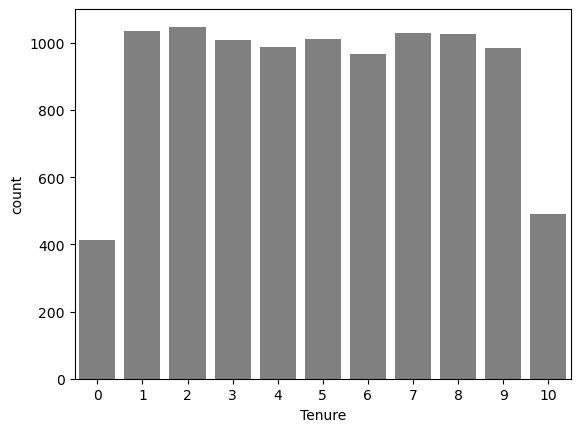

In [10]:
#Qual a quantidade de pessoas separado pelo tempo que são clientes do banco? 
# Análise: o período entre 1 a 9 anos possui uma quantidade de clientes equilibrada e clientes com menos de 1 ano e 10 anos não são expressivos.
sns.countplot(x=df["Tenure"], color = 'gray')

<AxesSubplot: >

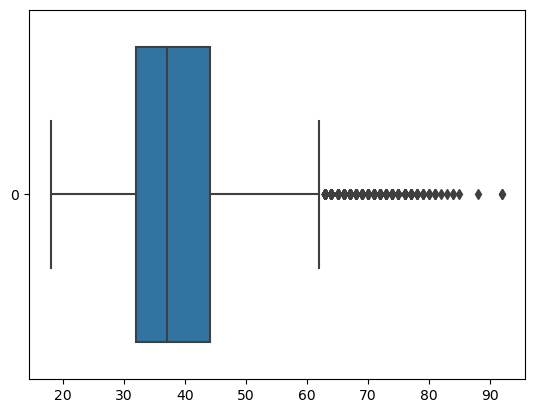

In [11]:
#Como está a dispersão das idades dos clientes?
# Análise: Mediana está em torno de 38 anos e o maior quartil está em torno dos 40 anos.
sns.boxplot(df.Age, orient="h")

<AxesSubplot: xlabel='Age', ylabel='count'>

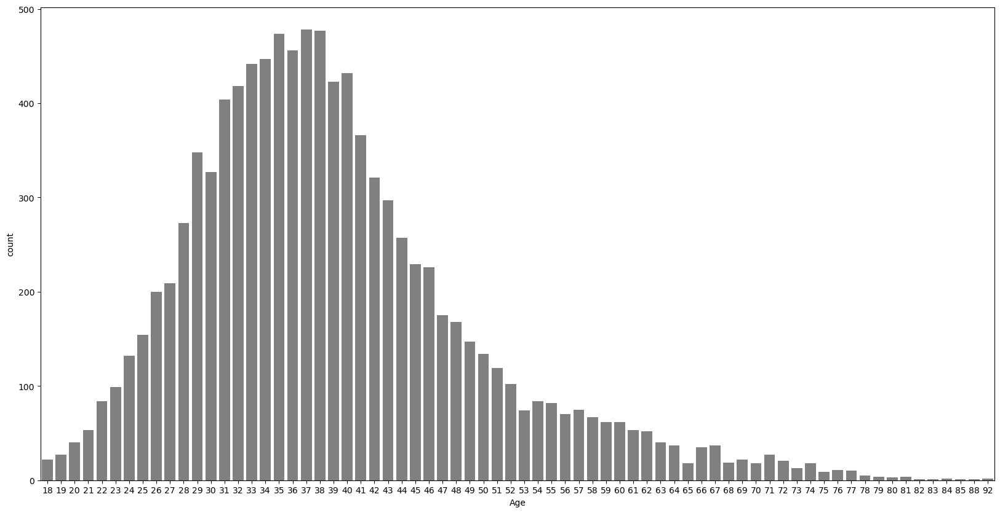

In [12]:
#Qual a quantidade de clientes por faixa etária?
# Análise: Maior parte dos clientes estão na faixa de 31 a 40 anos de idade.
plt.figure(figsize=(20,10))
sns.countplot(x=df["Age"], color = 'gray')

## <font color='blue'>Análise Bivariada</font>

<AxesSubplot: xlabel='Age', ylabel='Gender'>

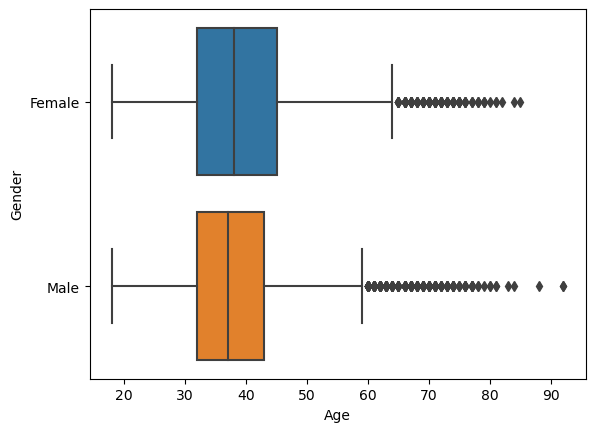

In [13]:
#Como está a dispersão das idades dos clientes separado por gênero?
# Análise: A faixa de idade entre os gêneros estão praticamente iguais. 
sns.boxplot(data=df, x="Age", y="Gender", orient="h")

<AxesSubplot: xlabel='Age', ylabel='count'>

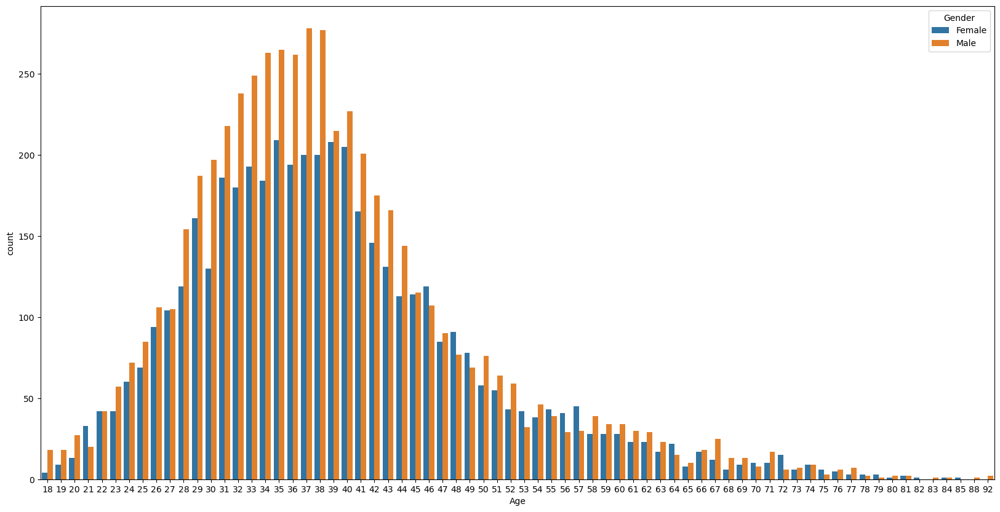

In [14]:
#Qual a quantidade de clientes por faixa etária separado por gênero?
# Análise: A curva normal mantem a mesma curvatura nos dois gêneros. 
plt.figure(figsize=(20,10))
sns.countplot(data=df, x="Age", hue="Gender")

<AxesSubplot: xlabel='Tenure', ylabel='Exited'>

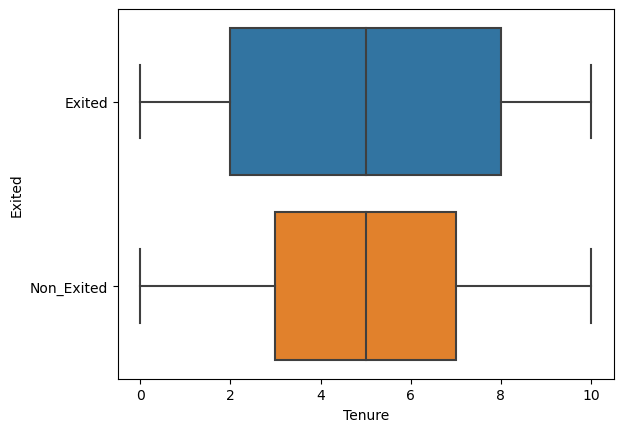

In [15]:
#Qual a dispersão das pessoas que deixaram ou não o banco com relação ao tempo que são clientes?
# Análise: Existe uma concentração de clientes que permaneceram na faixa entre 3 a 7 anos. Já os clientes que saíram, estão numa faixa maior, de 2 a 8 anos.
sns.boxplot(data=df, x="Tenure", y="Exited", orient="h")

<AxesSubplot: xlabel='Age', ylabel='Exited'>

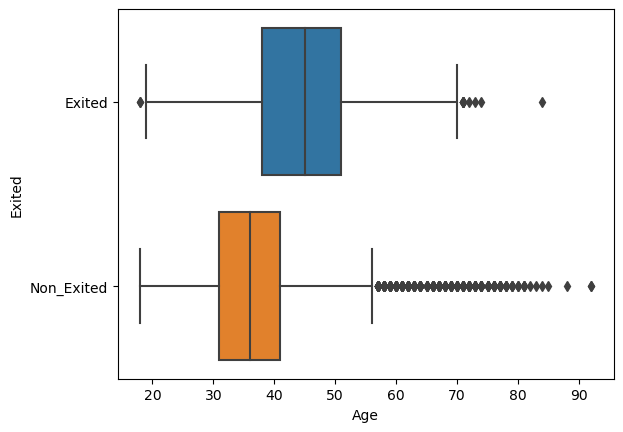

In [16]:
#Qual a dispersão das pessoas que deixaram ou não o banco com relação à suas idades?
# Análise: A faixa etária entre 40 a 50 anos demonstrou uma evasão maior e a faixa entre 30 a 40 anos demonstrou maior permanência.
sns.boxplot(data=df, x="Age", y="Exited", orient="h")

<AxesSubplot: xlabel='count', ylabel='Gender'>

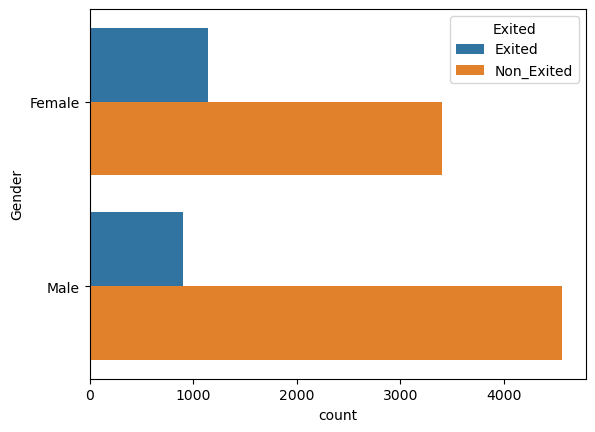

In [17]:
#Qual o gênero que mais deixou e qual que mais permaneceu cliente do banco?
# Análise: O público feminino demonstra ter uma maior proporção de saídas, já o público masculino, possui maior retenção. 
sns.countplot(data=df, y="Gender", hue="Exited")

<AxesSubplot: xlabel='count', ylabel='Geography'>

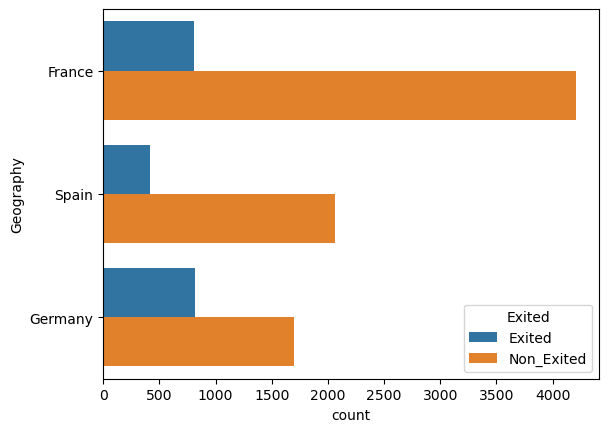

In [18]:
#Qual o país que mais reteve clientes?
# Análise: Podemos analisar que a Alemanha possui menor quantidade de clientes no total e maior número de evasão. Ao contrário da Alemanha, a França tem mais clientes e maior retenção.
sns.countplot(data=df, y="Geography", hue="Exited")

<AxesSubplot: xlabel='count', ylabel='Geography'>

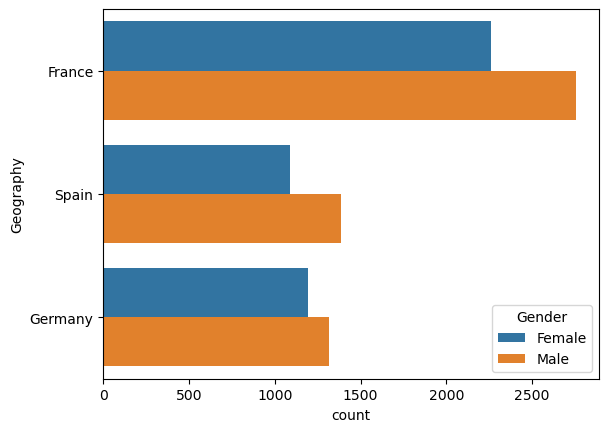

In [19]:
#Qual país tem mais clientes separados por gênero? 
# Análise: França possui mais clientes nos dois gêneros.
sns.countplot(data=df, y="Geography", hue="Gender")

In [20]:
#Qual a média de salários por país?
# Análise: Observamos um equilíbrio salarial entre os países.
df.groupby('Geography')['EstimatedSalary'].mean().sort_values(ascending=False)

Geography
Germany    101113.435102
France      99899.180814
Spain       99440.572281
Name: EstimatedSalary, dtype: float64

In [21]:
#Qual a média, mín e máx do Credit Score separados pelo tempo de conta no banco?
# Análise: Credit Score possui uma média constante entre os anos.
df.groupby('Tenure')['CreditScore'].describe()

,count,mean,std,min,25%,50%,75%,max
Tenure,,,,,,,,
0,413.0,652.043584,96.408808,350.0,590.0,653.0,717.00,850.0
1,1035.0,648.806763,96.227373,350.0,578.0,652.0,717.00,850.0
2,1048.0,652.832061,96.353984,399.0,588.0,654.0,717.25,850.0
3,1009.0,650.530228,97.458861,350.0,581.0,650.0,716.00,850.0
4,989.0,651.502528,95.742143,351.0,583.0,651.0,718.00,850.0
5,1012.0,650.527668,96.422651,395.0,584.0,654.0,721.00,850.0
6,967.0,647.380558,98.912565,359.0,581.5,648.0,718.00,850.0
7,1028.0,649.606031,95.577970,373.0,586.0,650.0,717.00,850.0
8,1025.0,647.749268,97.443326,358.0,583.0,649.0,710.00,850.0


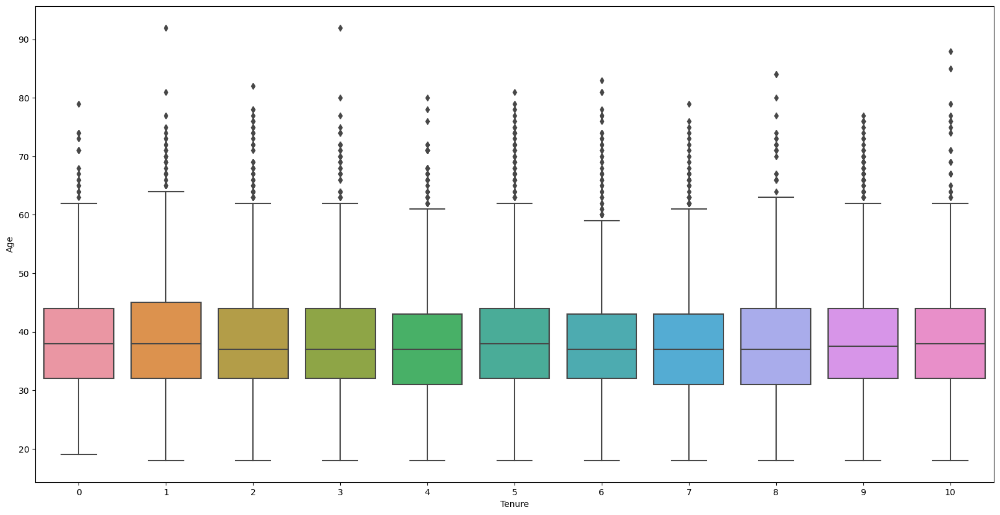

In [22]:
#Qual a dispersão das idades dos clientes separados pelo tempo de conta no banco?
# Análise: A faixa etária está entre 33 a 45 anos e se mantém ao longo dos anos de permanência no banco.
plt.figure(figsize=(20,10))
sns.boxplot(data = df, y = 'Age', x = 'Tenure')
plt.show()

C:\Users\u1285310\AppData\Local\Temp\ipykernel_14664\562630555.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.triu(np.ones_like(df.corr(),dtype = bool))
C:\Users\u1285310\AppData\Local\Temp\ipykernel_14664\562630555.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'seismic',vmin=-1, vmax=1)


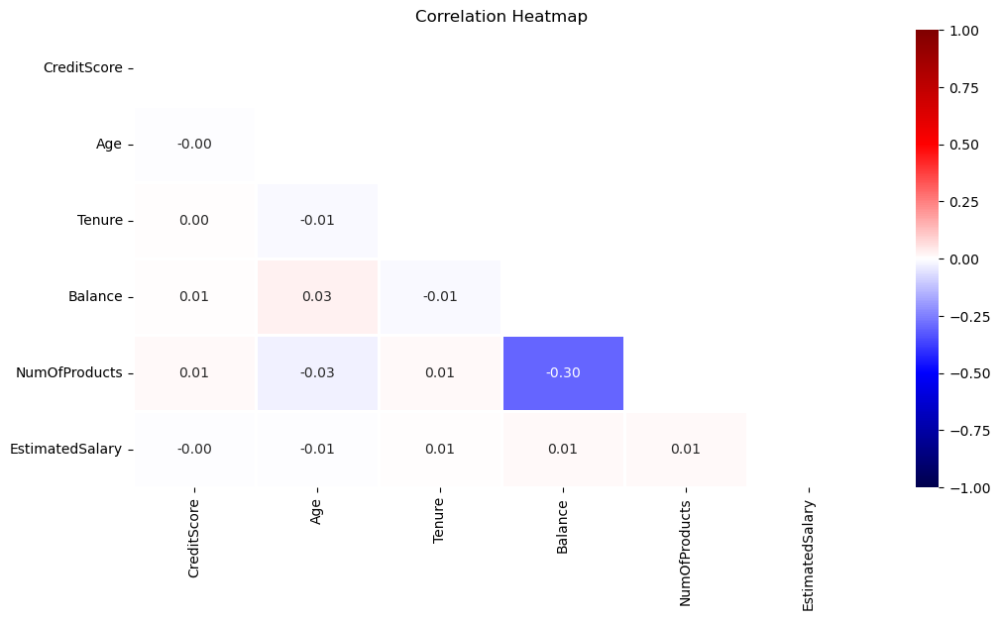

In [23]:
#Qual a correlação entre a variáveis?
# Análise: A maior correlação entre as variáveis é a correlação negativa entre o número de produtos e o saldo em conta, porém essa correlação é baixa.
plt.figure(figsize=(12, 6))
mask = np.triu(np.ones_like(df.corr(),dtype = bool))
sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'seismic',vmin=-1, vmax=1)
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

In [24]:
profile = pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## <font color='blue'>Análise Multivariada</font>

<AxesSubplot: xlabel='Geography', ylabel='Age'>

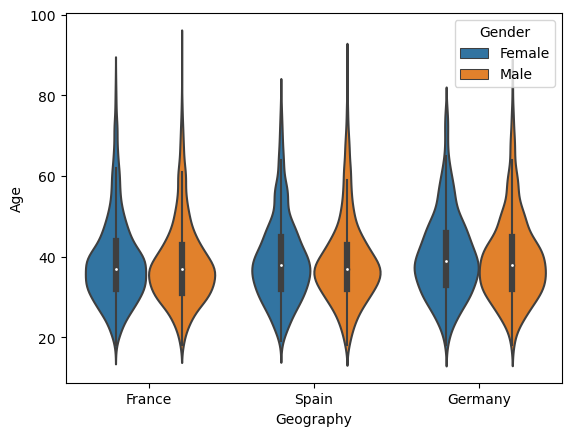

In [25]:
#Qual o perfil de idade por gênero de cada país?
# Análise: O perfil de idade se mantém entre os países e o gêneros.
sns.violinplot(data=df, x="Geography", y="Age", hue="Gender")

<AxesSubplot: xlabel='Geography', ylabel='Age'>

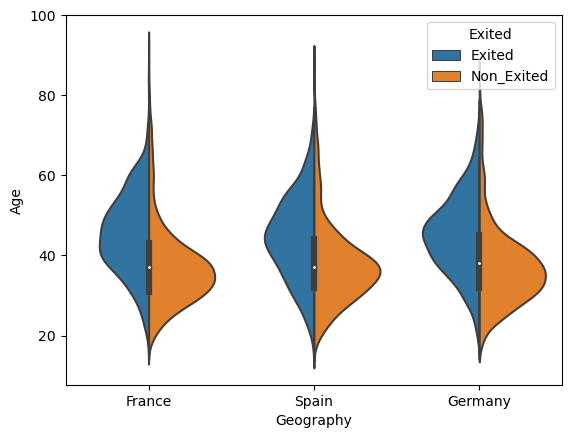

In [26]:
#Qual o perfil de idade das pessoas que deixaram o banco separado por país?
# Análise: Existe uma diferença de faixa etária entre os clientes que saíram e que permaneceram, sendo que os que deixaram o banco possuem uma faixa etária maior e permanece o mesmo perfil entre os países.
sns.violinplot(data=df, x="Geography", y="Age", hue="Exited", split=True)

<AxesSubplot: xlabel='Gender', ylabel='Age'>

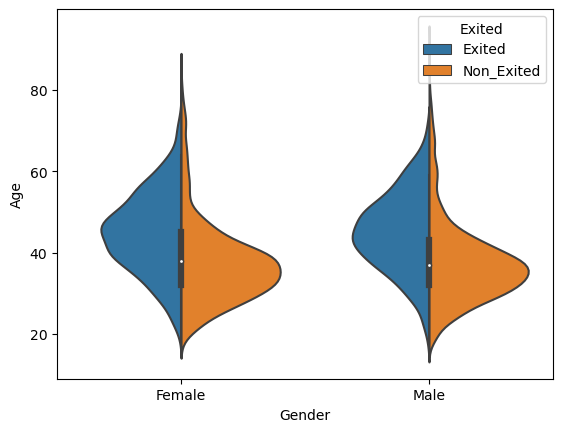

In [27]:
#Qual o perfil de idade das pessoas que deixaram o banco separado gênero?
# Análise: Faixa etária de retençaõ e evasão permanece a mesmo entre os gêneros, sendo a faixa etária maior de saída e a menor de retenção.
sns.violinplot(data=df, x="Gender", y="Age", hue="Exited", split=True)

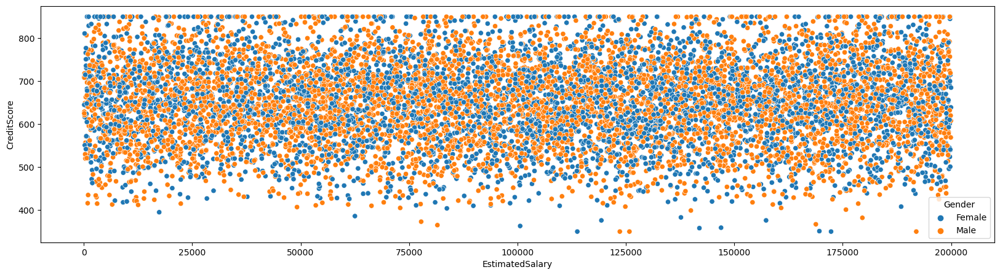

In [28]:
#Qual a dispersão entre o salário e o Credit Score por gênero?
# Análise: Sem conclusões.
plt.figure(figsize=(20,5))
sns.scatterplot(x='EstimatedSalary', y='CreditScore', data=df, hue='Gender')
plt.show()

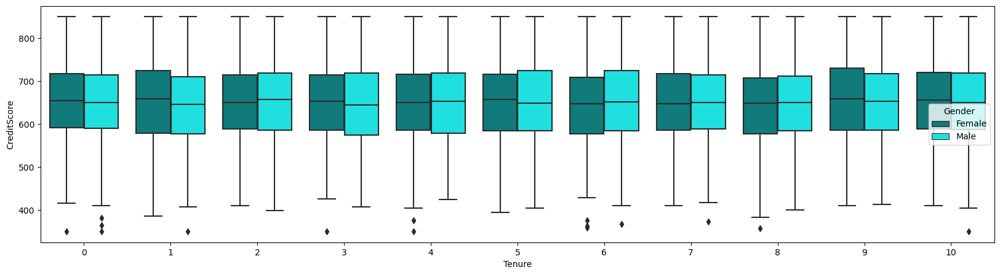

In [29]:
#Qual a dispersão do Credit Score por gênero separado pelo tempo de conta no banco?
# Análise: Os dois gêneros possuem a mesma faixa de pontuação de score durante os anos de permanência no banco.
plt.figure(figsize=(20,5))
sns.boxplot(x = 'Tenure', y = "CreditScore", data = df, hue = 'Gender', palette = ['#008B8B','#00FFFF'])
plt.show()

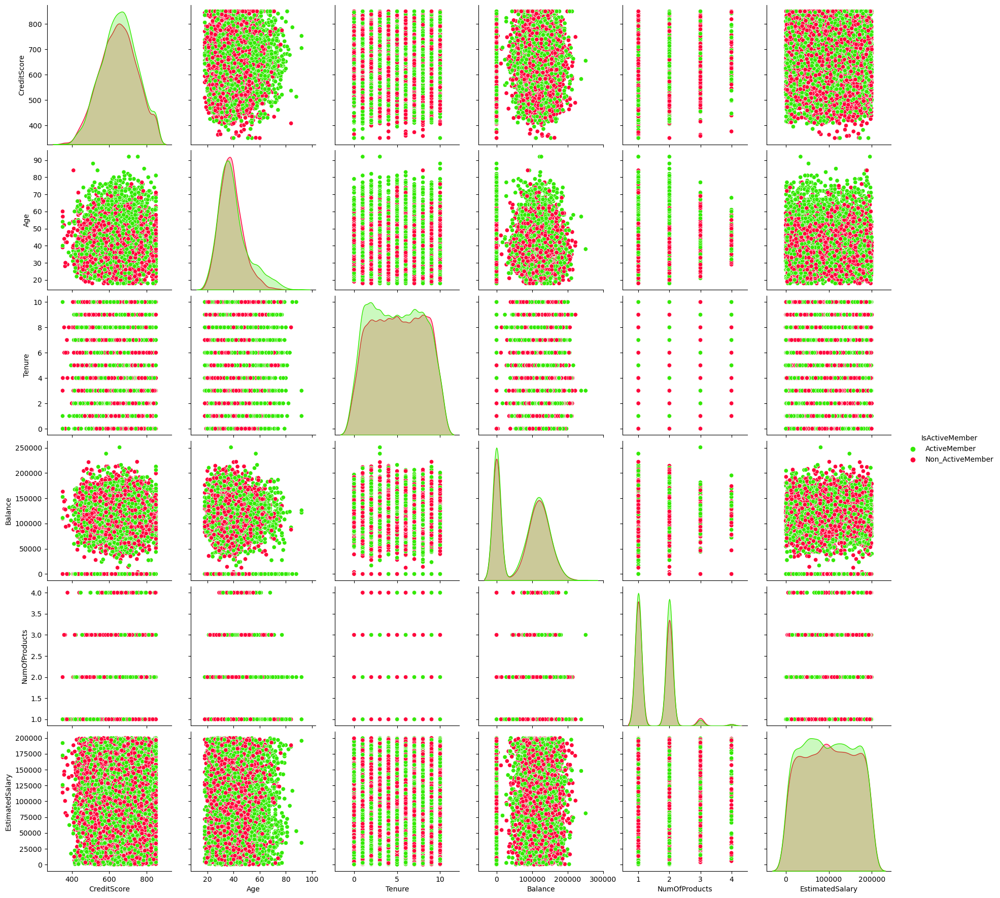

In [30]:
#Análise da dispersão e histograma entre as variáveis, evidenciando se a pessoa é um cliente ativo ou não.
# Análise: Não identificamos nenhuma relação entre as variáveis com relação a clientes ativos e inativos. 
sns.pairplot(df,hue = 'IsActiveMember' , height = 3 , palette = 'prism')

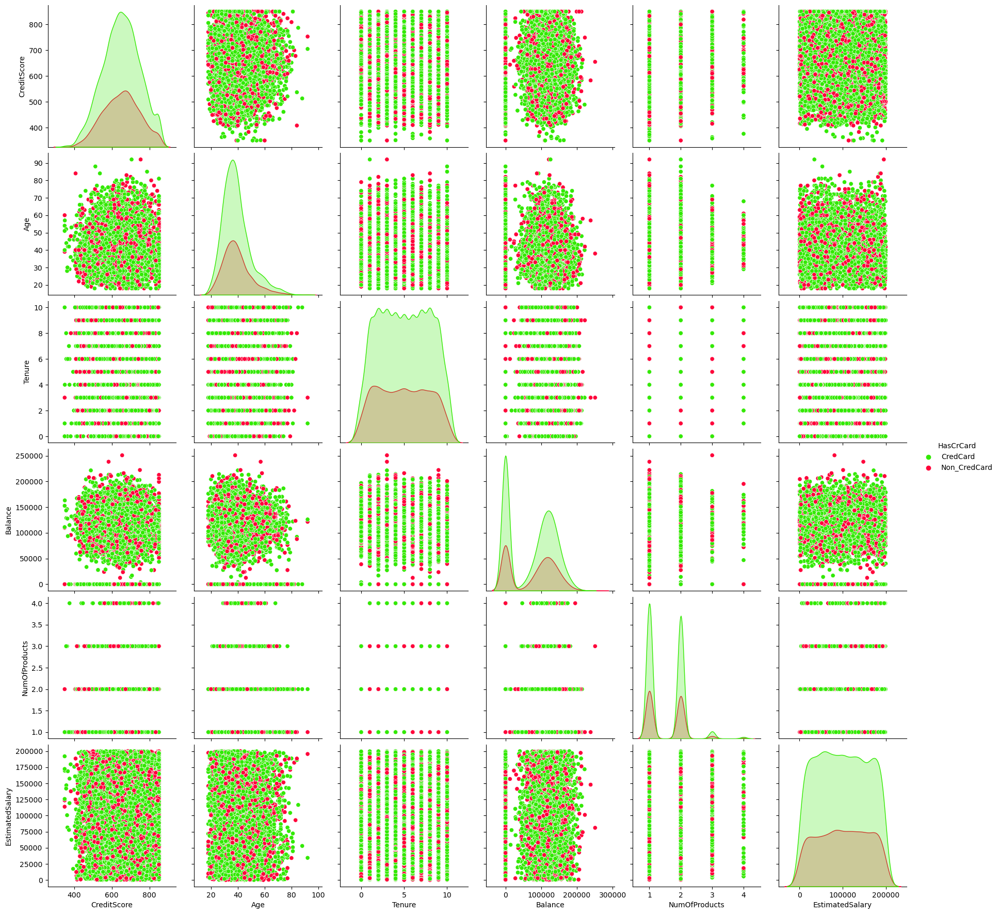

In [31]:
#Análise da dispersão e histograma entre as variáveis, evidenciando se o cliente tem cartão de crédito ou não.
#Análise: Não identificamos nenhuma relação entre as variáveis com relação a clientes que possuem cartão de crédito ou não.
sns.pairplot(df,hue = 'HasCrCard' , height = 3 , palette = 'prism')

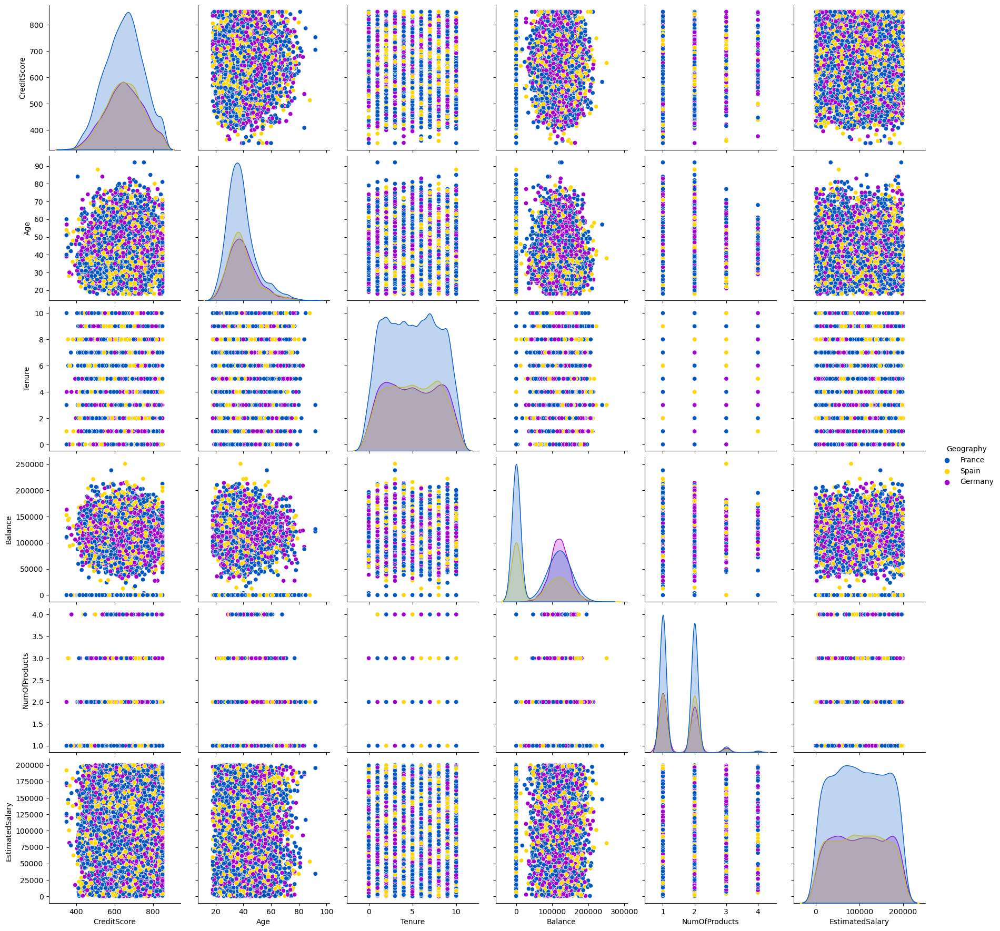

In [32]:
#Análise da dispersão e histograma entre as variáveis, evidenciando dados de cada país.
#Análise: Não identificamos nenhuma relação entre as variáveis com relação aos países dos clientes.
sns.pairplot(df,hue = 'Geography' , height = 3 , palette = 'prism')

## <font color='blue'>ALGORITMO DE CLASSIFICAÇÃO</font>

In [33]:
#Transformação das váriáveis categóricas para variáveis numéricas
df.HasCrCard = df.HasCrCard.replace({'Non_CredCard':0,'CredCard':1})
df.IsActiveMember = df.IsActiveMember.replace({'Non_ActiveMember':0,'ActiveMember':1})
df.Exited = df.Exited.replace({'Non_Exited':0,'Exited':1})
df.Gender = df.Gender.replace({'Female':0,'Male':1})
df.Geography = df.Geography.replace({'France':1,'Spain':2, 'Germany':3})
df = df.drop("Surname", axis=1) #Remover a variável "Surname".
df.head(5)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,1,0,42,2,0.00,1,1,1,101348.88,1
1,608,2,0,41,1,83807.86,1,0,1,112542.58,0
2,502,1,0,42,8,159660.80,3,1,0,113931.57,1
3,699,1,0,39,1,0.00,2,0,0,93826.63,0
4,850,2,0,43,2,125510.82,1,1,1,79084.10,0


In [34]:
#Separação das features X e y
X = df.drop("Exited", axis=1)
y = df.Exited

In [35]:
#Separação dos dados em Train (70%) e Test (30%) com um random_state=42.
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42) 

### <font color='blue'>Árvore de Decisão</font>

In [36]:
#Criação de um objeto Árvore de Decisão para um modelo de classificação, com um Nível de Profundidade = 2 e uma Semente para reprodutibilidade = 42
from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(max_depth=2, random_state = 42) #Criaçao do modelo

In [37]:
#Treinamento do modelo criado
decision_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=2, random_state=42)

In [38]:
#Execução da previsão do modelo em Train and Test
y_train_pred = decision_tree.predict(X_train) #Prediccion en Train
y_test_pred = decision_tree.predict(X_test) #Prediccion en Test

In [39]:
#Cálculo da matriz de confusão
from sklearn.metrics import confusion_matrix
matriz = confusion_matrix(y_test, y_test_pred)
print('Matriz de Confusión:')
print(matriz)

Matriz de Confusión:
[[2307  109]
 [ 353  231]]


In [40]:
#Cálculo das métricas de avaliação 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn import metrics

# Cálculo da acurácia de teste
test_accuracy = accuracy_score(y_test, y_test_pred)
print('Valor da acurácia de teste: ',test_accuracy)

# Cálculo da acurácia de treino
train_accuracy = accuracy_score(y_train, y_train_pred)
print('Valor da acurácia de treino: ',train_accuracy)

# Cálculo da precisão
precision = precision_score(y_test, y_test_pred)
print('Valor da precisão: ',precision)

# Cálculo da sensibilidade (recall)
recall = recall_score(y_test, y_test_pred)
print('Valor da sensibilidade: ',recall)

# Cálculo do valor F1
f1 = f1_score(y_test, y_test_pred)
print('Valor F1: ',f1)

# Cálculo da área sob a curva ROC (AUC-ROC)
auc_roc = roc_auc_score(y_test, y_test_pred)
print('Área sob a curva ROC: ',auc_roc)

print('MAE:', metrics.mean_absolute_error(y_test, y_test_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

Valor da acurácia de teste:  0.846
Valor da acurácia de treino:  0.8387142857142857
Valor da precisão:  0.6794117647058824
Valor da sensibilidade:  0.3955479452054795
Valor F1:  0.5
Área sob a curva ROC:  0.6752160255828722
MAE: 0.154
MSE: 0.154
RMSE: 0.3924283374069717


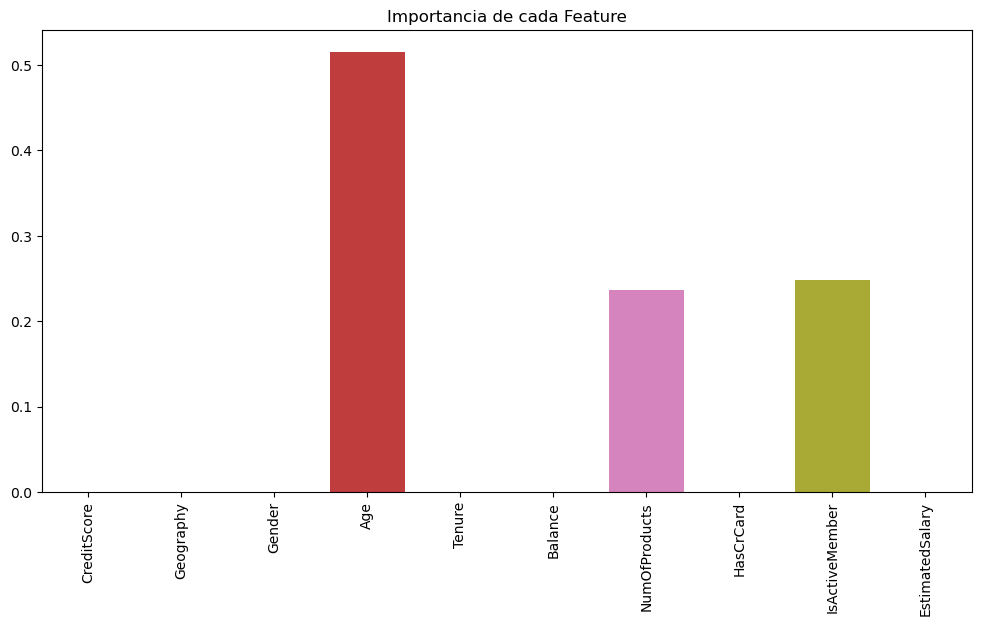

In [41]:
#Visualização das variáveis de maior importância
import seaborn as sns

plt.figure(figsize=(12, 6))
plt.xticks(rotation = 90)
importances = decision_tree.feature_importances_
columns = X.columns
sns.barplot(x=columns, y=importances)
plt.title('Importancia de cada Feature')
plt.show()

### <font color='blue'>K-nearest neighbors (KNN)</font>

In [42]:
from sklearn.neighbors import KNeighborsClassifier

Text(0, 0.5, 'Acurácia')

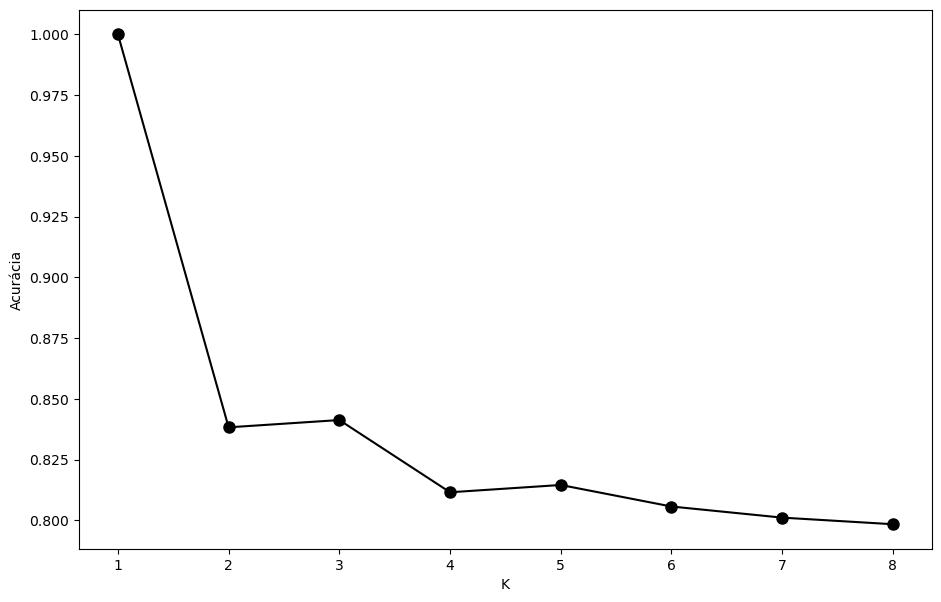

In [43]:
#Escolha do número de K, visualmente através do gráfico
k = 9

error_rate = []
for i in range(1,k):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_train)
    error_rate.append(accuracy_score(y_train, yhat))

plt.figure(figsize=(11, 7))
plt.plot(range(1,k),error_rate, color = 'black', 
         marker='o', markersize = 8)
plt.xlabel('K')
plt.ylabel('Acurácia')

In [44]:
#Execução da previsão do modelo em Train and Test com K=3
knn = KNeighborsClassifier(n_neighbors=3).fit(X, y)

y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

In [45]:
#Cálculo da matriz de confusão
from sklearn.metrics import confusion_matrix
matriz = confusion_matrix(y_test, y_test_pred)
print('Matriz de Confusión:')
print(matriz)

Matriz de Confusión:
[[2297  119]
 [ 370  214]]


In [46]:
#Cálculo das métricas de avaliação 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn import metrics

# Cálculo da acurácia de teste
test_accuracy = accuracy_score(y_test, y_test_pred)
print('Valor da acurácia de teste: ',test_accuracy)

# Cálculo da acurácia de treino
train_accuracy = accuracy_score(y_train, y_train_pred)
print('Valor da acurácia de treino: ',train_accuracy)

# Cálculo da precisão
precision = precision_score(y_test, y_test_pred)
print('Valor da precisão: ',precision)

# Cálculo da sensibilidade (recall)
recall = recall_score(y_test, y_test_pred)
print('Valor da sensibilidade: ',recall)

# Cálculo do valor F1
f1 = f1_score(y_test, y_test_pred)
print('Valor F1: ',f1)

# Cálculo da área sob a curva ROC (AUC-ROC)
auc_roc = roc_auc_score(y_test, y_test_pred)
print('Área sob a curva ROC: ',auc_roc)

print('MAE:', metrics.mean_absolute_error(y_test, y_test_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

Valor da acurácia de teste:  0.837
Valor da acurácia de treino:  0.8418571428571429
Valor da precisão:  0.6426426426426426
Valor da sensibilidade:  0.3664383561643836
Valor F1:  0.4667393675027263
Área sob a curva ROC:  0.6585916946384831
MAE: 0.163
MSE: 0.163
RMSE: 0.403732584763727


### <font color='blue'>Regressão Logística</font>

In [47]:
from sklearn.linear_model import LogisticRegression

In [48]:
reg_logistica = LogisticRegression().fit(X, y)

y_test_pred = reg_logistica.predict(X_test)
y_train_pred = reg_logistica.predict(X_train)

In [49]:
#Cálculo das métricas de avaliação 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn import metrics

# Cálculo da acurácia de teste
test_accuracy = accuracy_score(y_test, y_test_pred)
print('Valor da acurácia de teste: ',test_accuracy)

# Cálculo da acurácia de treino
train_accuracy = accuracy_score(y_train, y_train_pred)
print('Valor da acurácia de treino: ',train_accuracy)

# Cálculo da precisão
precision = precision_score(y_test, y_test_pred)
print('Valor da precisão: ',precision)

# Cálculo da sensibilidade (recall)
recall = recall_score(y_test, y_test_pred)
print('Valor da sensibilidade: ',recall)

# Cálculo do valor F1
f1 = f1_score(y_test, y_test_pred)
print('Valor F1: ',f1)

# Cálculo da área sob a curva ROC (AUC-ROC)
auc_roc = roc_auc_score(y_test, y_test_pred)
print('Área sob a curva ROC: ',auc_roc)

print('MAE:', metrics.mean_absolute_error(y_test, y_test_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

Valor da acurácia de teste:  0.802
Valor da acurácia de treino:  0.7847142857142857
Valor da precisão:  0.4479166666666667
Valor da sensibilidade:  0.07363013698630137
Valor F1:  0.12647058823529414
Área sob a curva ROC:  0.525846525446793
MAE: 0.198
MSE: 0.198
RMSE: 0.4449719092257398


### <font color='blue'>Radom Forest</font>

In [50]:
from sklearn.ensemble import RandomForestClassifier

In [51]:
# Não houve melhora utilizando outros valores como "n_estimators = 50, max_depth = 2, max_features = 3"
rf = RandomForestClassifier(random_state = 11).fit(X_train, y_train)

y_test_pred = rf.predict(X_test) #Prediccion en Test
y_train_pred = rf.predict(X_train)

In [52]:
#Cálculo da matriz de confusão
from sklearn.metrics import confusion_matrix
matriz = confusion_matrix(y_test, y_test_pred)
print('Matriz de Confusión:')
print(matriz)

Matriz de Confusión:
[[2327   89]
 [ 305  279]]


In [53]:
#Cálculo das métricas de avaliação 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn import metrics

# Cálculo da acurácia de teste
test_accuracy = accuracy_score(y_test, y_test_pred)
print('Valor da acurácia de teste: ',test_accuracy)

# Cálculo da acurácia de treino
train_accuracy = accuracy_score(y_train, y_train_pred)
print('Valor da acurácia de treino: ',train_accuracy)

# Cálculo da precisão
precision = precision_score(y_test, y_test_pred)
print('Valor da precisão: ',precision)

# Cálculo da sensibilidade (recall)
recall = recall_score(y_test, y_test_pred)
print('Valor da sensibilidade: ',recall)

# Cálculo do valor F1
f1 = f1_score(y_test, y_test_pred)
print('Valor F1: ',f1)

# Cálculo da área sob a curva ROC (AUC-ROC)
auc_roc = roc_auc_score(y_test, y_test_pred)
print('Área sob a curva ROC: ',auc_roc)

print('MAE:', metrics.mean_absolute_error(y_test, y_test_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_test_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

Valor da acurácia de teste:  0.8686666666666667
Valor da acurácia de treino:  1.0
Valor da precisão:  0.7581521739130435
Valor da sensibilidade:  0.4777397260273973
Valor F1:  0.5861344537815126
Área sob a curva ROC:  0.7204509888415132
MAE: 0.13133333333333333
MSE: 0.13133333333333333
RMSE: 0.36239941133138354


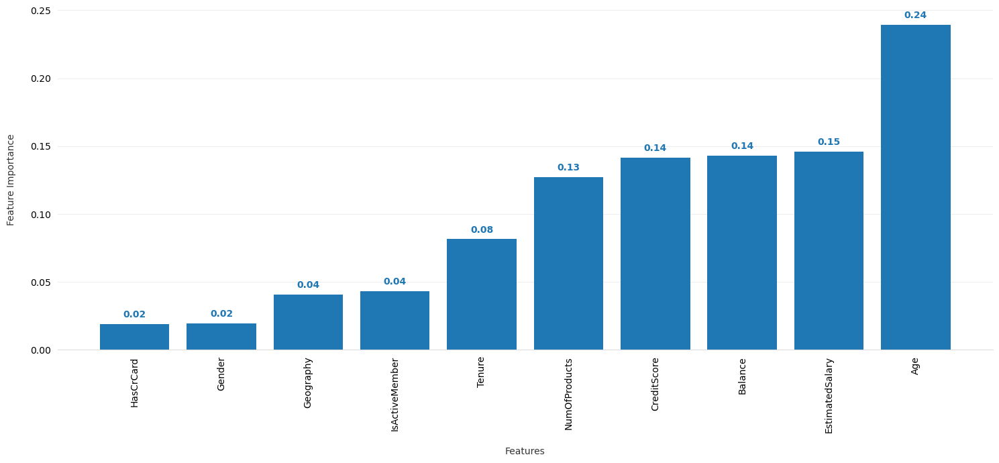

In [54]:
#Avaliação das features mais importantes do dataset através do "feature_importances".
sorted_idx = rf.feature_importances_.argsort()

fig, ax = plt.subplots(figsize = (15,7))
bars = ax.bar(X_train.columns[sorted_idx], rf.feature_importances_[sorted_idx])

# Axis formatting.
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_color('#DDDDDD')
ax.tick_params(bottom=False, left=False)
ax.set_axisbelow(True)
ax.yaxis.grid(True, color = "#EEEEEE")
ax.xaxis.grid(False)

# Add text annotations to the top of the bars.
bar_color = bars[0].get_facecolor()
for bar in bars:
  ax.text(
      bar.get_x() + bar.get_width() / 2,
      bar.get_height() + 0.005,
      round(bar.get_height(), 2),
      horizontalalignment = "center",
      color = bar_color,
      weight = "bold"
  )

ax.set_xlabel("Features", labelpad=15, color='#333333')
ax.set_ylabel("Feature Importance", labelpad=15, color='#333333')
plt.xticks(rotation = 90)
fig.tight_layout()

## <font color='blue'>CONCLUSÃO</font>

|Métricas| Árvore de Decisão| KNN| Radom Forest | Regressão Logística|
|---|---|---|---|---|
| Acurácia | 0.846 | 0.837 | 0.868| 0.802|
|Precisão | 0.679 | 0.642 | 0.758| 0.447|
|Sensibilidade | 0.395 | 0.366 | 0.477| 0.073|
|Valor F1 | 0.5 | 0.466 | 0.586| 0.126|
|AUC-ROC | 0.675 | 0.658 | 0.720| 0.525|
|MAE | 0.154 | 0.163 | 0.131| 0.198|
|MSE | 0.154 | 0.163 | 0.131| 0.198|
|RMSE | 0.392 | 0.403 | 0.362| 0.444|

#### <font color='black'>CONCLUSÃO: </font>
Ao comparar as métricas de avaliação dos modelos considerados, é possível observar que o modelo "Radom Forest" é o mais apropriado para fazer previsões dos dados de teste. A razão é que com este modelo, a acurácia é maior e as métricas MAE, MSE e RMSE são menores em relação aos outros modelos, indicando maior precisão das previsões.